In [1]:
!pip install -qU diffusers
!pip install -qU transformers
!pip install -qU controlnet_aux
!pip install -qU onnxruntime-gpu
!pip install -qU insightface
!pip install -qU peft

In [2]:
!git clone https://github.com/InstantID/InstantID.git

Cloning into 'InstantID'...
remote: Enumerating objects: 513, done.
remote: Counting objects: 100% (350/350), done.
remote: Compressing objects: 100% (180/180), done.
remote: Total 513 (delta 257), reused 195 (delta 169), pack-reused 163
Receiving objects: 100% (513/513), 154.47 MiB | 55.64 MiB/s, done.
Resolving deltas: 100% (283/283), done.


In [3]:
import  sys
sys.path.append('/kaggle/working/InstantID')

In [4]:
import os
import cv2
import math
import torch
import random
import numpy as np
import argparse
from pathlib import Path
from matplotlib import pyplot as plt

import PIL
from PIL import Image

import diffusers
from diffusers.utils import load_image, make_image_grid
from diffusers.models import ControlNetModel
from diffusers.pipelines.controlnet.multicontrolnet import MultiControlNetModel

from huggingface_hub import hf_hub_download

from insightface.app import FaceAnalysis
from controlnet_aux import OpenposeDetector
from transformers import DPTImageProcessor, DPTForDepthEstimation, BlipForConditionalGeneration, AutoProcessor

from pipeline_stable_diffusion_xl_instantid_full import StableDiffusionXLInstantIDPipeline
from pipeline_stable_diffusion_xl_instantid_img2img import StableDiffusionXLInstantIDImg2ImgPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
2024-05-26 19:00:49.206513: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-26 19:00:49.206682: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-26 19:00:49.347439: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Global variables

In [5]:
MAX_SEED = np.iinfo(np.int32).max
DEVICE = 'cuda'
DTYPE = torch.float16

## Download InstantID checkpoints

In [6]:
from huggingface_hub import hf_hub_download
hf_hub_download(repo_id="InstantX/InstantID", filename="ControlNetModel/config.json", local_dir="./checkpoints")
hf_hub_download(repo_id="InstantX/InstantID", filename="ControlNetModel/diffusion_pytorch_model.safetensors", local_dir="./checkpoints")
hf_hub_download(repo_id="InstantX/InstantID", filename="ip-adapter.bin", local_dir="./checkpoints")

ControlNetModel/config.json:   0%|          | 0.00/1.38k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

ip-adapter.bin:   0%|          | 0.00/1.69G [00:00<?, ?B/s]

'checkpoints/ip-adapter.bin'

In [7]:
!pip install gdown

In [8]:
import gdown
output='/kaggle/working/'
url = "https://drive.google.com/file/d/18wEUfMNohBJ4K3Ly5wpTejPfDzp-8fI8/view?usp=sharing"
gdown.download(url=url, output=output, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=18wEUfMNohBJ4K3Ly5wpTejPfDzp-8fI8
From (redirected): https://drive.google.com/uc?id=18wEUfMNohBJ4K3Ly5wpTejPfDzp-8fI8&confirm=t&uuid=89607514-3618-4254-a089-8f05b72fedd8
To: /kaggle/working/antelopev2.zip
100%|██████████| 361M/361M [00:01<00:00, 186MB/s] 


'/kaggle/working/antelopev2.zip'

In [9]:
!unzip /kaggle/working/antelopev2.zip -d  models/

Archive:  /kaggle/working/antelopev2.zip
   creating: models/antelopev2/
  inflating: models/antelopev2/genderage.onnx  
  inflating: models/antelopev2/2d106det.onnx  
  inflating: models/antelopev2/1k3d68.onnx  
  inflating: models/antelopev2/glintr100.onnx  
  inflating: models/antelopev2/scrfd_10g_bnkps.onnx  


In [10]:
# Load face encoder
app = FaceAnalysis(
    name="antelopev2",
    root="/kaggle/working/",
    providers=["CUDAExecutionProvider", "CPUExecutionProvider"],
)
app.prepare(ctx_id=0, det_size=(640, 640))

2024-05-26 19:01:37.490099494 [E:onnxruntime:Default, provider_bridge_ort.cc:1744 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1426 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory

2024-05-26 19:01:38.109560657 [E:onnxruntime:Default, provider_bridge_ort.cc:1744 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1426 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory

2024-05-26 19:01:38.135580465 [E:onnxruntime:Default, provider_bridge_ort.cc:1744 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /kaggle/working/models/antelopev2/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /kaggle/working/models/antelopev2/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /kaggle/working/models/antelopev2/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}


2024-05-26 19:01:38.342780807 [E:onnxruntime:Default, provider_bridge_ort.cc:1744 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1426 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory



find model: /kaggle/working/models/antelopev2/glintr100.onnx recognition ['None', 3, 112, 112] 127.5 127.5
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /kaggle/working/models/antelopev2/scrfd_10g_bnkps.onnx detection [1, 3, '?', '?'] 127.5 128.0
set det-size: (640, 640)


2024-05-26 19:01:39.143743339 [E:onnxruntime:Default, provider_bridge_ort.cc:1744 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1426 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory



## Load ControlNet model

In [11]:
# Path to InstantID models
face_adapter = f"./checkpoints/ip-adapter.bin"
controlnet_path = f"./checkpoints/ControlNetModel"

# Load pipeline face ControlNetModel
controlnet_identitynet = ControlNetModel.from_pretrained(
    controlnet_path, torch_dtype=DTYPE
)

# controlnet-pose
controlnet_pose_model = "thibaud/controlnet-openpose-sdxl-1.0"
controlnet_canny_model = "diffusers/controlnet-canny-sdxl-1.0"

controlnet_pose = ControlNetModel.from_pretrained(
    controlnet_pose_model, torch_dtype=DTYPE
)
controlnet_canny = ControlNetModel.from_pretrained(
    controlnet_canny_model, torch_dtype=DTYPE
)

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.31k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

## Load openpose checkpoint

In [12]:
openpose_model = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

hand_pose_model.pth:   0%|          | 0.00/147M [00:00<?, ?B/s]

facenet.pth:   0%|          | 0.00/154M [00:00<?, ?B/s]

## Load BLIP model to extract prompt

In [13]:
class CaptionModel:
    def __init__(self):
        self.caption_model = BlipForConditionalGeneration.from_pretrained('Salesforce/blip-image-captioning-base', torch_dtype=DTYPE)
        self.caption_processor = AutoProcessor.from_pretrained('Salesforce/blip-image-captioning-base')
        self.caption_model.eval()
        self.caption_max_length=32
    
    def generate_caption(self, pil_image: Image) -> str:
        self.caption_model = self.caption_model.to(DEVICE)
        inputs = self.caption_processor(images=pil_image, return_tensors="pt").to(DEVICE)
        tokens = self.caption_model.generate(**inputs, max_new_tokens=self.caption_max_length)
        self.caption_model = self.caption_model.to('cpu')
        return self.caption_processor.batch_decode(tokens, skip_special_tokens=True)[0].strip()

In [14]:
caption_model = CaptionModel()

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

## PROCESSING FUNCTIONS

In [15]:
def draw_kps(
        image_pil,
        kps,
        color_list=[
            (255, 0, 0),
            (0, 255, 0),
            (0, 0, 255),
            (255, 255, 0),
            (255, 0, 255),
        ],
    ):
        stickwidth = 4
        limbSeq = np.array([[0, 2], [1, 2], [3, 2], [4, 2]])
        kps = np.array(kps)

        w, h = image_pil.size
        out_img = np.zeros([h, w, 3])

        for i in range(len(limbSeq)):
            index = limbSeq[i]
            color = color_list[index[0]]

            x = kps[index][:, 0]
            y = kps[index][:, 1]
            length = ((x[0] - x[1]) ** 2 + (y[0] - y[1]) ** 2) ** 0.5
            angle = math.degrees(math.atan2(y[0] - y[1], x[0] - x[1]))
            polygon = cv2.ellipse2Poly(
                (int(np.mean(x)), int(np.mean(y))),
                (int(length / 2), stickwidth),
                int(angle),
                0,
                360,
                1,
            )
            out_img = cv2.fillConvexPoly(out_img.copy(), polygon, color)
        out_img = (out_img * 0.6).astype(np.uint8)

        for idx_kp, kp in enumerate(kps):
            color = color_list[idx_kp]
            x, y = kp
            out_img = cv2.circle(out_img.copy(), (int(x), int(y)), 10, color, -1)

        out_img_pil = Image.fromarray(out_img.astype(np.uint8))
        return out_img_pil

In [16]:
def get_canny_img(image, t1=100, t2=200):
    image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
    edges = cv2.Canny(image, t1, t2)
    return Image.fromarray(edges, "L")

In [17]:
def resize_img(
        input_image,
        max_side=1280,
        min_side=1024,
        size=None,
        pad_to_max_side=False,
        mode=PIL.Image.BILINEAR,
        base_pixel_number=64,
    ):
        w, h = input_image.size
        if size is not None:
            w_resize_new, h_resize_new = size
        else:
            ratio = min_side / min(h, w)
            w, h = round(ratio * w), round(ratio * h)
            ratio = max_side / max(h, w)
            input_image = input_image.resize([round(ratio * w), round(ratio * h)], mode)
            w_resize_new = (round(ratio * w) // base_pixel_number) * base_pixel_number
            h_resize_new = (round(ratio * h) // base_pixel_number) * base_pixel_number
        input_image = input_image.resize([w_resize_new, h_resize_new], mode)

        if pad_to_max_side:
            res = np.ones([max_side, max_side, 3], dtype=np.uint8) * 255
            offset_x = (max_side - w_resize_new) // 2
            offset_y = (max_side - h_resize_new) // 2
            res[
                offset_y : offset_y + h_resize_new, offset_x : offset_x + w_resize_new
            ] = np.array(input_image)
            input_image = Image.fromarray(res)
        return input_image

In [18]:
def convert2cv2(image):
    if not isinstance(image, np.ndarray):
        return cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
    else:
        return cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

In [19]:
def get_face_keypoints(pose_image, enhance_face_region=True):
    pose_image = resize_img(pose_image, max_side=768)    
    pose_image_cv2 = convert2cv2(pose_image)
    height, width, _ = pose_image_cv2.shape

    # Extract face features
    face_info = app.get(pose_image_cv2)
    
    if len(face_info) == 0:
        return None
    
    face_info = face_info[-1]
    face_kps = draw_kps(pose_image, face_info["kps"])
    
    width, height = face_kps.size
    
    if enhance_face_region:
        control_mask = np.zeros([height, width, 3])
        x1, y1, x2, y2 = face_info["bbox"]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        control_mask[y1:y2, x1:x2] = 255
        control_mask = Image.fromarray(control_mask.astype(np.uint8))
    else:
        control_mask = None
    
    return face_kps, control_mask, width, height, pose_image

In [20]:
def get_face_embedding(pose_image):
    pose_image = resize_img(pose_image, max_side=768)
    pose_image_cv2 = convert2cv2(pose_image)
    height, width, _ = pose_image_cv2.shape
    
    # Extract face features
    face_info = app.get(pose_image_cv2)
    face_info = sorted(face_info, key=lambda x:(x['bbox'][2]-x['bbox'][0])*(x['bbox'][3]-x['bbox'][1]))[-1]  # only use the maximum face
    face_emb = face_info["embedding"]
    
    return face_emb

In [21]:
TRANSFORMED_STYLES = {
    'anime': {
        'path': 'cagliostrolab/animagine-xl-3.1',
        'sex_special': {
            ('woman', 'girl'): '1girl, cagliostro, granblue fantasy',
            ('man', 'boy'): '1boy, male focus, gojou satoru',
            'default': '1girl/1boy'
        },
        'prepend': 'anime style, {sex_info}, masterpiece, best quality, very aesthetic',
        'neg_prompt': 'nsfw, lowres, (bad), text, error, fewer, extra, missing, worst quality, jpeg artifacts, low quality, watermark, unfinished, displeasing, oldest, early, chromatic aberration, signature, extra digits, artistic error, username, scan, [abstract]'
    },
    'cartoon': {
        'path': 'stabilityai/stable-diffusion-xl-base-1.0',
        'path_lora': 'goofyai/disney_style_xl',
        'prepend': 'disney style, {sex_info}',
        'sex_special': {
            ('woman', 'girl'): '1girl',
            ('man', 'boy'): '1boy, male focus',
            'default': '1girl/1boy'
        },
        'neg_prompt': 'extra fingers, mutated hands, poorly drawn hands, poorly drawn face, poor details, deformed, artifacts, digital noise, ugly, deformed, disfigured, bad anatomy'
    }
}

In [22]:
controlnet_map = {
    "pose": controlnet_pose,
    "canny": controlnet_canny
}
controlnet_map_fn = {
    "pose": openpose_model,
    "canny": get_canny_img,
}

In [23]:
def define_controlnet_pipeline(pipe, config_controlnet, face_kps, img_controlnet, width, height, controlnet_map_fn):
    controlnet_selection = config_controlnet['controlnet_selection']
    pose_strength, canny_strength = config_controlnet['pose_strength'], config_controlnet['canny_strength']
    identitynet_strength_ratio = config_controlnet['identitynet_strength_ratio']
    
    controlnet_scales = {
        "pose": pose_strength,
        "canny": canny_strength
    }
    
    pipe.controlnet = MultiControlNetModel(
        [controlnet_identitynet]
        + [controlnet_map[s] for s in controlnet_selection]
    )
    control_scales = [float(identitynet_strength_ratio)] + [
        controlnet_scales[s] for s in controlnet_selection
    ]
    control_images = [face_kps] + [
        controlnet_map_fn[s](img_controlnet).resize((width, height))
        for s in controlnet_selection
    ]
    
    return pipe, control_scales, control_images

## DEFINE CONFIG

In [24]:
CONFIG = dict(
    anime = dict(
        control_net=dict(
            controlnet_selection=['pose', 'canny'],
            pose_strength=0.4,
            canny_strength=0.4,
            identitynet_strength_ratio=0.6
        ),
        seed=90525516,
        num_inference_steps=50,
        strength=0.7,
        guidance_scale=7.5,
        adapter_strength_ratio=0.6,
        scheduler='EulerAncestralDiscreteScheduler' #EulerDiscreteScheduler
    ),
    cartoon = dict(
        control_net=dict(
            controlnet_selection=['pose', 'canny'],
            pose_strength=0.4,
            canny_strength=0.3,
            identitynet_strength_ratio=0.2
        ),
        seed=90525516,
        num_inference_steps=40,
        strength=0.8,
        guidance_scale=7.5,
        adapter_strength_ratio=0.4,
        scheduler='EulerAncestralDiscreteScheduler' #EulerDiscreteScheduler
    )
)

## SAMPLE RUNNING

In [25]:
sample_image = Image.open('/kaggle/input/humanactivitiesv2/humanphotos/pexels-cottonbro-4571276.jpg').convert('RGB')

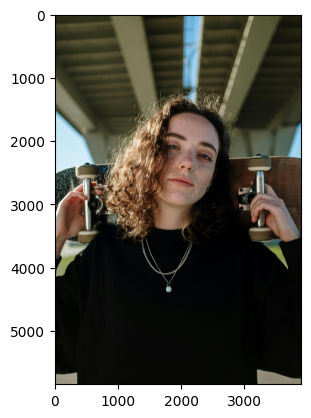

In [26]:
plt.imshow(sample_image)

In [27]:
face_emb = get_face_embedding(sample_image)

/opt/conda/lib/python3.10/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


In [28]:
assert face_emb is not None

In [29]:
face_kps, controlmask, width, height, pose_image = get_face_keypoints(sample_image)

In [30]:
assert face_kps is not None

### Test with anime pipeline

In [31]:
try:
    del pipe, control_scales, control_images, images, prompt
    torch.cuda.empty_cache()
except Exception as e:
    print(e)

name 'pipe' is not defined


In [32]:
generator = torch.Generator(device='cpu').manual_seed(CONFIG['anime']['seed'])

In [33]:
ratio = sample_image.size[0] / sample_image.size[1]
prompt = caption_model.generate_caption(sample_image.resize((int(512*ratio),512)))

In [34]:
if TRANSFORMED_STYLES['anime'].get('prepend', '') != '':
    sex_info = TRANSFORMED_STYLES['anime'].get('sex_special', None)
    prepend = TRANSFORMED_STYLES['anime'].get('prepend', '')
    if sex_info is not None:
        for k, v in sex_info.items():
            if isinstance(k, tuple):
                if any([prompt.__contains__(i) for i in k]):
                    prepend = prepend.replace('{sex_info}', v)
                    break
        else:
            prepend = prepend.replace('{sex_info}', sex_info['default'])
        
    prompt =  prepend + ', ' + prompt

In [35]:
print(prompt)

anime style, 1girl, cagliostro, granblue fantasy, masterpiece, best quality, very aesthetic, a woman holding a skateboard under a bridge


In [36]:
pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
            TRANSFORMED_STYLES['anime']['path'],
            controlnet=[controlnet_identitynet],
            torch_dtype=DTYPE,
            feature_extractor=None,
            use_safetensors=True
        )
pipe.scheduler = getattr(diffusers, CONFIG['anime']['scheduler']).from_config(
        pipe.scheduler.config
)

model_index.json:   0%|          | 0.00/680 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/464 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/856 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/462 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/654 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.77k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [37]:
pipe, control_scales, control_images = define_controlnet_pipeline(pipe, CONFIG['anime']['control_net'], face_kps, pose_image, width, height, controlnet_map_fn)

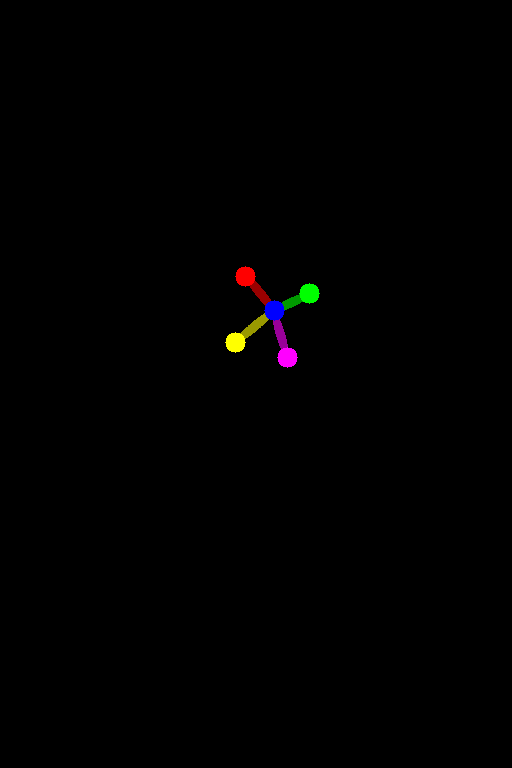

In [43]:
viz_face_kps = control_images[0]
viz_face_kps.save('viz_face_kps.png')
viz_face_kps

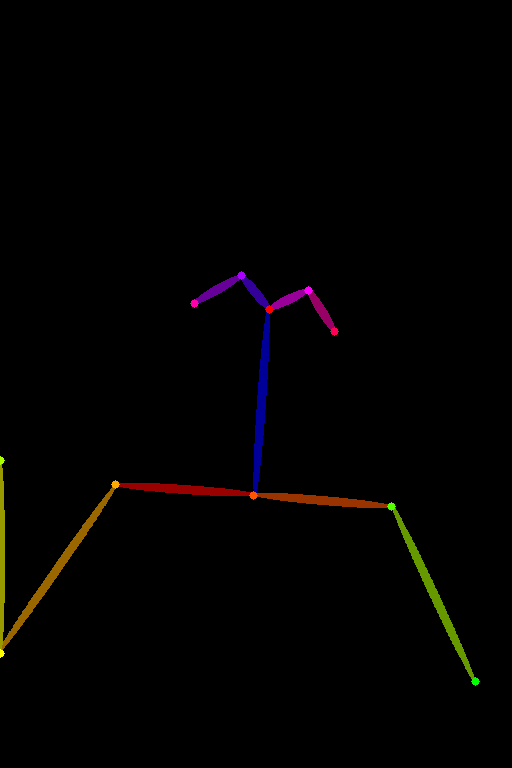

In [41]:
viz_pos_image = control_images[1]
viz_pos_image.save('viz_pos_image.png')
viz_pos_image

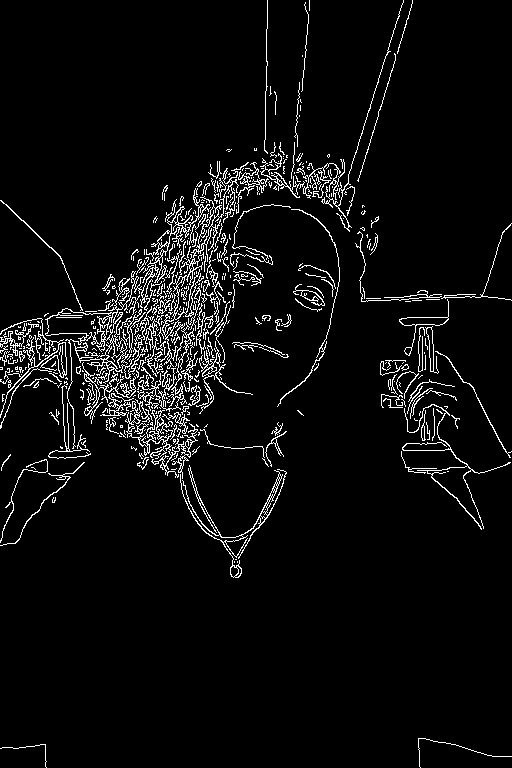

In [42]:
viz_canny_image = control_images[2]
viz_canny_image.save('viz_canny_image.png')
viz_canny_image

In [85]:
pipe.enable_model_cpu_offload()
pipe.enable_vae_tiling()

In [86]:
pipe.load_ip_adapter_instantid(face_adapter)
pipe.set_ip_adapter_scale(CONFIG['anime']['adapter_strength_ratio'])

images = pipe(
    image=sample_image,
    prompt=prompt,
    negative_prompt=TRANSFORMED_STYLES['anime']['neg_prompt'],
    image_embeds=face_emb,
    control_image=control_images,
    controlnet_conditioning_scale=control_scales,
    strength=CONFIG['anime']['strength'],
    num_inference_steps=CONFIG['anime']['num_inference_steps'],
    guidance_scale=CONFIG['anime']['guidance_scale'],
    height=height,
    width=width,
    generator=generator,
).images

  0%|          | 0/35 [00:00<?, ?it/s]

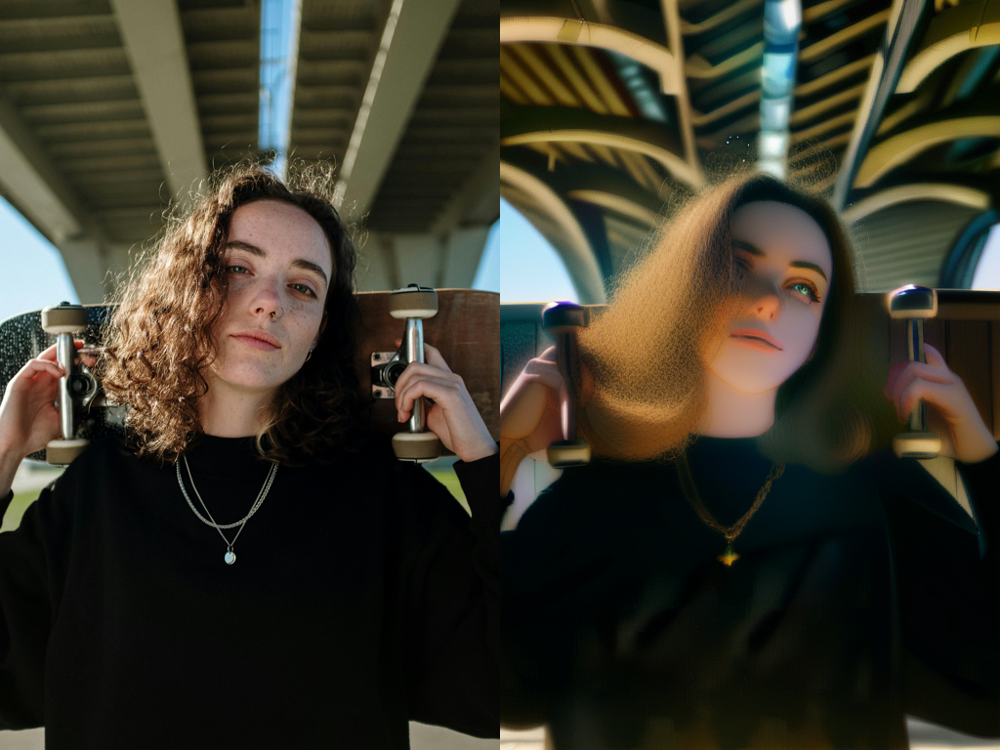

In [87]:
make_image_grid([sample_image.resize((width, height), Image.Resampling.BICUBIC), images[0]], rows=1, cols=2)

### Test with cartoon pipeline

In [32]:
generator = torch.Generator(device='cpu').manual_seed(CONFIG['cartoon']['seed'])

In [95]:
del pipe, control_scales, control_images, images, prompt
torch.cuda.empty_cache()

In [33]:
ratio = sample_image.size[0] / sample_image.size[1]
prompt = caption_model.generate_caption(sample_image.resize((int(512*ratio),512)))

In [34]:
if TRANSFORMED_STYLES['cartoon'].get('prepend', '') != '':
    sex_info = TRANSFORMED_STYLES['cartoon'].get('sex_special', None)
    prepend = TRANSFORMED_STYLES['cartoon'].get('prepend', '')
    if sex_info is not None:
        for k, v in sex_info.items():
            if isinstance(k, tuple):
                if any([prompt.__contains__(i) for i in k]):
                    prepend = prepend.replace('{sex_info}', v)
                    break
        else:
            prepend = prepend.replace('{sex_info}', sex_info['default'])
        
    prompt =  prepend + ', ' + prompt

In [35]:
print(prompt)

disney style, 1girl, a woman holding a skateboard under a bridge


In [36]:
pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
            TRANSFORMED_STYLES['cartoon']['path'],
            controlnet=[controlnet_identitynet],
            torch_dtype=DTYPE,
            feature_extractor=None,
            use_safetensors=True
        )
pipe.load_lora_weights(TRANSFORMED_STYLES['cartoon']['path_lora'])
pipe.scheduler = getattr(diffusers, CONFIG['cartoon']['scheduler']).from_config(
        pipe.scheduler.config
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [52]:
pipe, control_scales, control_images = define_controlnet_pipeline(pipe, CONFIG['cartoon']['control_net'], face_kps, pose_image, width, height, controlnet_map_fn)

In [53]:
pipe.enable_model_cpu_offload()
pipe.enable_vae_tiling()

In [54]:
pipe.load_ip_adapter_instantid(face_adapter)
pipe.set_ip_adapter_scale(CONFIG['cartoon']['adapter_strength_ratio'])

images = pipe(
    image=sample_image,
    prompt=prompt,
    negative_prompt=TRANSFORMED_STYLES['cartoon']['neg_prompt'],
    image_embeds=face_emb,
    control_image=control_images,
    controlnet_conditioning_scale=control_scales,
    strength=CONFIG['cartoon']['strength'],
    num_inference_steps=CONFIG['cartoon']['num_inference_steps'],
    guidance_scale=CONFIG['cartoon']['guidance_scale'],
    height=height,
    width=width,
    generator=generator,
).images

  0%|          | 0/32 [00:00<?, ?it/s]

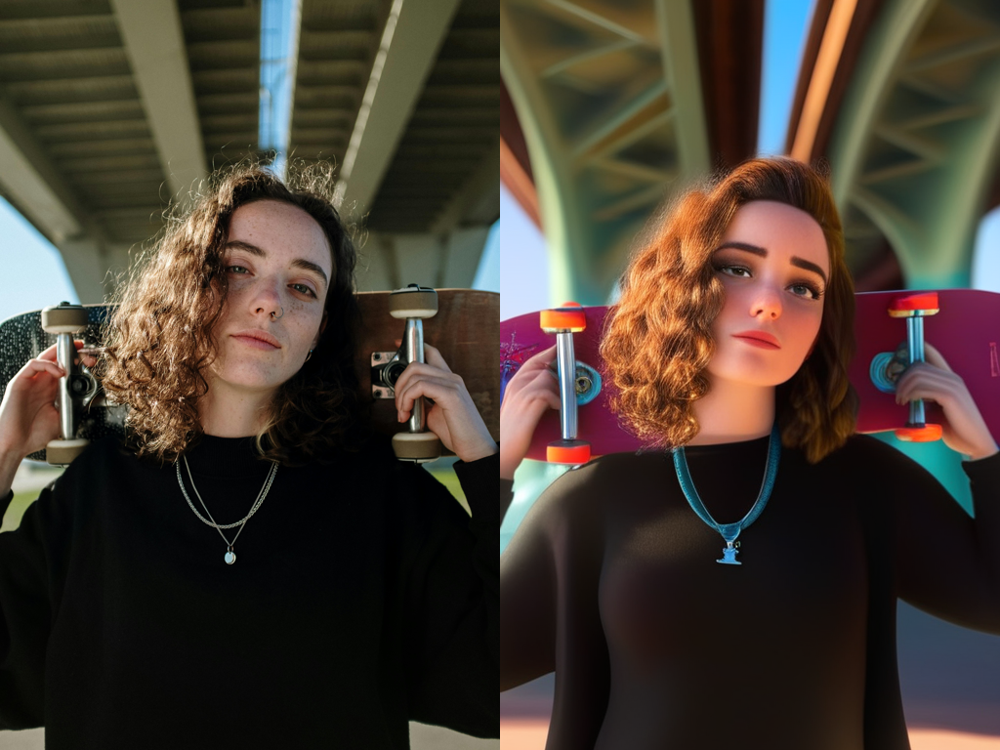

In [55]:
make_image_grid([sample_image.resize((width, height), Image.Resampling.BICUBIC), images[0]], rows=1, cols=2)

## DEFINE FULL PROCESSING FLOW

In [46]:
def load_pipeline(style, use_lora=False, use_safetensor=True):
    pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
                TRANSFORMED_STYLES[style]['path'],
                controlnet=[controlnet_identitynet],
                torch_dtype=DTYPE,
                feature_extractor=None,
                use_safetensors=use_safetensor
            )
    if use_lora:
        pipe.load_lora_weights(TRANSFORMED_STYLES[style]['path_lora'])
    pipe.scheduler =  getattr(diffusers, CONFIG[style]['scheduler']).from_config(
        pipe.scheduler.config
    )
    return pipe

In [47]:
def single_image_flow(pipeline, image, style, generator, guidance_scale=None, strength=None):
    # Get initial prompt
    ratio = image.size[0] / image.size[1]
    prompt = caption_model.generate_caption(image.resize((int(512*ratio),512)))
    
    # Get final prompt
    if TRANSFORMED_STYLES[style].get('prepend', '') != '':
        sex_info = TRANSFORMED_STYLES[style].get('sex_special', None)
        prepend = TRANSFORMED_STYLES[style].get('prepend', '')
        if sex_info is not None:
            for k, v in sex_info.items():
                if isinstance(k, tuple):
                    if any([prompt.__contains__(i) for i in k]):
                        prepend = prepend.replace('{sex_info}', v)
                        break
            else:
                prepend = prepend.replace('{sex_info}', sex_info['default'])
        
    prompt =  prepend + ', ' + prompt
        
    # Get face embedding
    face_emb = get_face_embedding(image)
    
    if face_emb is None:
        return {}
    
    # Get face keypoints
    face_kps, controlmask, width, height, pose_image = get_face_keypoints(image)
    
    if face_kps is None:
        return {}
    
    # Update pipeline with new ControlNet value
    pipe, control_scales, control_images = define_controlnet_pipeline(
        pipeline, CONFIG[style]['control_net'], face_kps, pose_image, width, height, controlnet_map_fn)
    
    pipe.enable_model_cpu_offload()
    pipe.enable_vae_tiling()
    
    # Start running pipeline
    pipe.load_ip_adapter_instantid(face_adapter)
    pipe.set_ip_adapter_scale(CONFIG[style]['adapter_strength_ratio'])

    images = pipe(
        image=image,
        prompt=prompt,
        negative_prompt=TRANSFORMED_STYLES[style]['neg_prompt'],
        image_embeds=face_emb,
        control_image=control_images,
        controlnet_conditioning_scale=control_scales,
        strength=strength if strength is not None else CONFIG[style]['strength'],
        num_inference_steps=CONFIG[style]['num_inference_steps'],
        guidance_scale=guidance_scale if guidance_scale is not None else CONFIG[style]['guidance_scale'],
        height=height,
        width=width,
        generator=generator,
    ).images
    
    return {
        'transform': images[0],
        'origin': image.resize((width, height))
    }

In [48]:
def run_visualize_then_save(pipe, dataset, style='cartoon', generator=None):
    for img_path in dataset:
        print('--------', img_path.as_posix(), '----------')
        pil_img = Image.open(img_path).convert('RGB')
        result = single_image_flow(pipe, pil_img, style, generator)
        
        if len(result) > 0:
            grid = make_image_grid([result['origin'], result['transform']], rows=1, cols=2)
        
            # Save transform images
            save_dir = Path('/kaggle/working/').joinpath(style)
            save_dir.mkdir(parents=True, exist_ok=True)
                            
            single = save_dir.joinpath('single')
            single.mkdir(parents=True, exist_ok=True)
            save_path = single.joinpath(img_path.name)
            result['transform'].save(save_path.as_posix())
            
            
            pair = save_dir.joinpath('pair')
            pair.mkdir(parents=True, exist_ok=True)
            save_pair = pair.joinpath(img_path.name)
            grid.save(save_pair)
            
        else:
            print('Cannot perform transform on this image')

## HYPERPARAMETERS SURVEY

In [100]:
try:
    del pipe, control_scales, control_images, images, prompt
    torch.cuda.empty_cache()
except Exception as e:
    print(e)

### Test with anime pipeline

### Change GUIDANCE_SCALE value

In [101]:
pipe = load_pipeline('anime', use_lora=False, use_safetensor=True)

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [102]:
concat_images = []
for idx, guidance_scale in enumerate([5, 6, 7.5, 10]):
    result = single_image_flow(pipe, sample_image, 'anime', torch.Generator(device='cpu').manual_seed(CONFIG['anime']['seed']), guidance_scale)
    if idx == 0:
        concat_images.append(result['origin'])
    concat_images.append(result['transform'])

/opt/conda/lib/python3.10/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

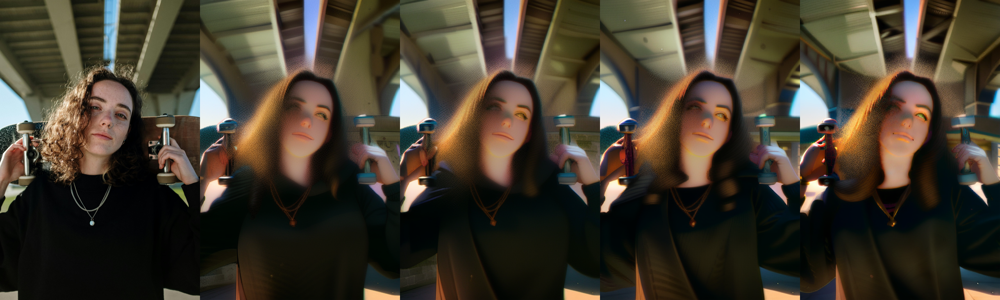

In [105]:
guidance_scale_survey = make_image_grid(concat_images, rows=1, cols=5)
guidance_scale_survey.save('guidance_scale_survey.png')
guidance_scale_survey

### Change STRENGTH value

In [106]:
del concat_images

In [107]:
concat_images = []
for idx, strength in enumerate([0.3, 0.5, 0.7, 0.9]):
    result = single_image_flow(pipe, sample_image, 'anime', torch.Generator(device='cpu').manual_seed(CONFIG['anime']['seed']), strength=strength)
    if idx == 0:
        concat_images.append(result['origin'])
    concat_images.append(result['transform'])

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

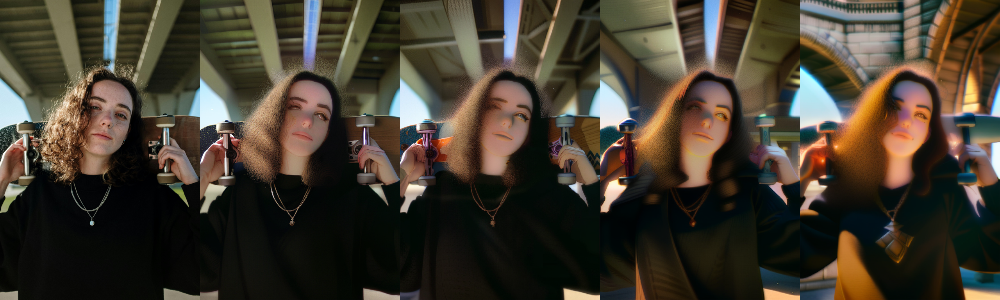

In [108]:
strength_survey = make_image_grid(concat_images, rows=1, cols=5)
strength_survey.save('strength_survey.png')
strength_survey

### Test with cartoon pipeline

### Change GUIDANCE_SCALE value

In [49]:
pipe = load_pipeline('cartoon', use_lora=True, use_safetensor=True)

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

disney_style_xl.safetensors:   0%|          | 0.00/341M [00:00<?, ?B/s]

In [50]:
concat_images = []
for idx, guidance_scale in enumerate([5, 6, 7.5, 10]):
    result = single_image_flow(pipe, sample_image, 'cartoon', torch.Generator(device='cpu').manual_seed(CONFIG['cartoon']['seed']), guidance_scale)
    if idx == 0:
        concat_images.append(result['origin'])
    concat_images.append(result['transform'])

/opt/conda/lib/python3.10/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

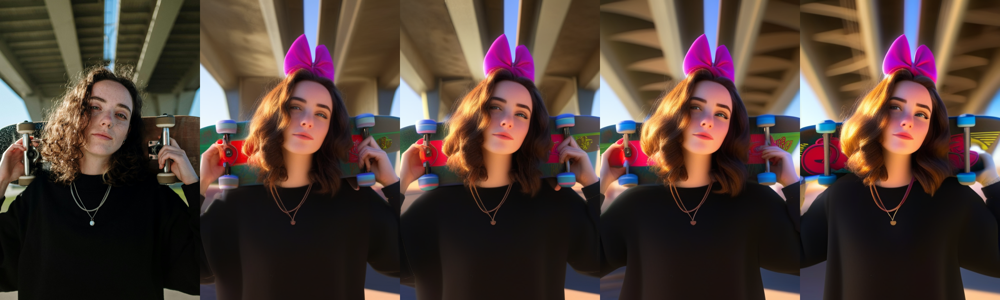

In [51]:
guidance_scale_survey = make_image_grid(concat_images, rows=1, cols=5)
guidance_scale_survey.save('guidance_scale_cartoon_survey.png')
guidance_scale_survey

### Change STRENGTH value

In [52]:
del concat_images

In [53]:
concat_images = []
for idx, strength in enumerate([0.4, 0.6, 0.8, 0.9]):
    result = single_image_flow(pipe, sample_image, 'cartoon', torch.Generator(device='cpu').manual_seed(CONFIG['cartoon']['seed']), strength=strength)
    if idx == 0:
        concat_images.append(result['origin'])
    concat_images.append(result['transform'])

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

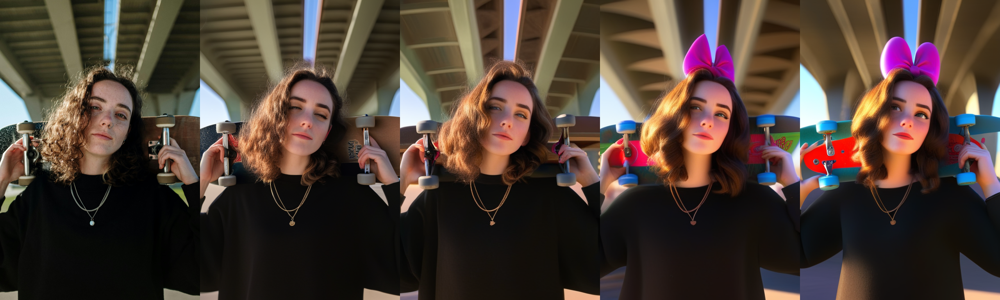

In [54]:
strength_survey = make_image_grid(concat_images, rows=1, cols=5)
strength_survey.save('strength_cartoon_survey.png')
strength_survey

# BENCHMARK RUNNING

In [ ]:
benchmark_dataset_path_lists = list(Path('/kaggle/input/humanactivitiesv2/humanphotos').rglob('*.*g'))

## CARTOON STYLES

In [50]:
generator = torch.Generator(device='cpu').manual_seed(CONFIG['cartoon']['seed'])
pipe = load_pipeline('cartoon', use_lora=True, use_safetensor=True)
run_visualize_then_save(pipe, benchmark_dataset_path_lists, 'cartoon', generator)

-------- /kaggle/input/humanactivitiesv2/humanphotos/pexels-blue-bird-7243194.jpg ----------


100%|██████████| 99/99 [00:00<00:00, 308.09it/s]


  0%|          | 0/20 [00:00<?, ?it/s]

-------- /kaggle/input/humanactivitiesv2/humanphotos/pexels-olly-3775164.jpg ----------


100%|██████████| 99/99 [00:00<00:00, 254.08it/s]


  0%|          | 0/20 [00:00<?, ?it/s]

-------- /kaggle/input/humanactivitiesv2/humanphotos/pexels-marcus-aurelius-6787160.jpg ----------


100%|██████████| 99/99 [00:00<00:00, 272.51it/s]


  0%|          | 0/20 [00:00<?, ?it/s]

-------- /kaggle/input/humanactivitiesv2/humanphotos/pexels-shvetsa-3771504.jpg ----------


100%|██████████| 99/99 [00:00<00:00, 263.45it/s]


  0%|          | 0/20 [00:00<?, ?it/s]

-------- /kaggle/input/humanactivitiesv2/humanphotos/pexels-amina-filkins-5560508.jpg ----------


100%|██████████| 99/99 [00:00<00:00, 251.42it/s]


  0%|          | 0/20 [00:00<?, ?it/s]

KeyboardInterrupt: 

## ANIME STYLES

In [51]:
generator = torch.Generator(device='cpu').manual_seed(CONFIG['anime']['seed'])
pipe = load_pipeline('anime', use_lora=False, use_safetensor=True)
run_visualize_then_save(pipe, all_image_paths, 'anime', generator)

model_index.json:   0%|          | 0.00/680 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/464 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/856 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/462 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.77k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/654 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

-------- /kaggle/input/humanactivitiesv2/humanphotos/pexels-blue-bird-7243194.jpg ----------


Flavor chain:   0%|          | 0/32 [00:00<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 224.00 MiB. GPU 0 has a total capacty of 15.89 GiB of which 208.12 MiB is free. Process 2885 has 15.69 GiB memory in use. Of the allocated memory 14.86 GiB is allocated by PyTorch, and 545.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF